In [ ]:
import yfinance as yf
import numpy as np
import pandas as pd
import math

import datetime as dt
from datetime import date

import seaborn as sns
import matplotlib.pyplot as plt

import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn import utils

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout, LSTM, Activation, Input
from keras.layers import LSTM, Bidirectional, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard

import warnings
warnings.filterwarnings('ignore')

import gc
gc.collect()

30

In [ ]:
def create_target(data, look_ahead=15):

    data['TargetReturn'] = np.log(data['Close'].shift(-look_ahead) / data['Close'])

    return data

In [ ]:
def select_features(data, target_col='TargetReturn', top_n=15):

    numeric_data = data.select_dtypes(include=[np.number])
    corr = numeric_data.corr()[target_col].drop(target_col)
    selected = corr.abs().sort_values(ascending=False).head(top_n).index.tolist()

    print("Selected Features:")
    for f in selected:
        print(f, corr[f])

    return selected

In [ ]:
def create_features(data):

    data['DailyReturn'] = np.log(data['Close'] / data['Close'].shift(1))

    return data

In [ ]:
def prepare_data(stock, sentiment_data=None):

  data = yf.download(stock, start="2020-03-01",
                     end="2026-03-31",
                     auto_adjust=True)

  if isinstance(data.columns, pd.MultiIndex):
    data.columns = data.columns.get_level_values(0)

  data = data.reset_index()
  min_rows_for_features = 2
  if len(data) < min_rows_for_features:
    print(f"Warning: Not enough data for {stock} (found {len(data)} rows.")
    return pd.DataFrame(), []

  data = create_features(data)
  data.replace([np.inf, -np.inf], np.nan, inplace=True) # Drop NaN values
  data.dropna(inplace=True)

  data = create_target(data)
  data.dropna(inplace=True)

  features_list = ['DailyReturn']

  # Keep 'Date', 'DailyReturn', and 'TargetReturn' in data_selected
  data_selected = data[features_list + ['TargetReturn', 'Date']].copy()

  return data_selected, features_list

In [ ]:
def create_sequences(X, y, lookback=15):

    X_seq = []
    y_seq = []

    for i in range(lookback, len(X)):
        X_seq.append(X[i-lookback:i])
        y_seq.append(y[i])

    return np.array(X_seq), np.array(y_seq)

In [ ]:
stocks = ['AADI.JK', 'ADMR.JK', 'ADRO.JK', 'AKRA.JK', 'AMMN.JK',
          'AMRT.JK', 'ANTM.JK', 'ASII.JK', 'BBCA.JK', 'BBNI.JK',
          'BBRI.JK', 'BBTN.JK', 'BMRI.JK', 'BREN.JK', 'BRPT.JK',
          'BUMI.JK', 'CPIN.JK', 'CTRA.JK', 'DSSA.JK', 'EMTK.JK',
          'EXCL.JK', 'GOTO.JK', 'HEAL.JK', 'ICBP.JK', 'INCO.JK',
          'INDF.JK', 'INKP.JK', 'ISAT.JK', 'ITMG.JK', 'JPFA.JK',
          'KLBF.JK', 'MAPI.JK', 'MBMA.JK', 'MDKA.JK', 'MEDC.JK',
          'NCKL.JK', 'PGAS.JK', 'PGEO.JK', 'PTBA.JK', 'SCMA.JK',
          'SMGR.JK', 'TLKM.JK', 'TOWR.JK', 'UNTR.JK', 'UNVR.JK'
          ]

lstm_pred_returns = []
lstm_evaluation_metrics = []
lstm_all_dates_test = {}
lstm_all_y_test_inv = {}
lstm_all_y_pred_inv = {}

for stock in stocks:
    keras.backend.clear_session()

    data_selected, features = prepare_data(stock)

    if not data_selected.empty and features:
        data_selected.dropna(inplace=True);

        final_dates = data_selected['Date'].reset_index(drop=True)

        scaler_X = MinMaxScaler((-1,1))
        scaler_y = MinMaxScaler((-1,1))

        X_scaled = scaler_X.fit_transform(data_selected[features])
        y_scaled = scaler_y.fit_transform(data_selected[['TargetReturn']])

        lookback = 15
        X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback=lookback)

        dates_for_sequences = final_dates.iloc[lookback:].reset_index(drop=True)

        train_size = int(len(X_seq)*0.8)

        X_train = X_seq[:train_size]
        X_test = X_seq[train_size:]

        y_train = y_seq[:train_size]
        y_test = y_seq[train_size:]

        # Split dates for the test set
        dates_test = dates_for_sequences[train_size:].reset_index(drop=True)

        # LSTM training
        model = Sequential()
        model.add(LSTM(32, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(LSTM(32))
        model.add(Dense(1))

        es= EarlyStopping(monitor= 'loss', min_delta= 1e-10, patience= 10, verbose= 1)
        rlr= ReduceLROnPlateau(monitor= 'loss', factor= 0.5, patience= 10, verbose= 1)

        model.compile(keras.optimizers.Adam(learning_rate= 0.01), loss= 'mean_squared_error')

        history = model.fit(X_train,
                            y_train,
                            epochs=100,
                            batch_size=32,
                            callbacks= [es, rlr],
                            validation_split=0.2,
                            verbose=1)

        # prediction
        y_pred = model.predict(X_test)
        y_pred_inv = scaler_y.inverse_transform(y_pred)
        y_test_inv = scaler_y.inverse_transform(y_test)

        y_pred_flat = y_pred_inv.flatten()
        y_test_flat = y_test_inv.flatten()

        rmse = np.sqrt(mean_squared_error(y_test_flat, y_pred_flat))
        nmse = mean_squared_error(y_test_flat, y_pred_flat) / np.var(y_test_flat)
        mae = sklearn.metrics.mean_absolute_error(y_test_flat, y_pred_flat)
        r2 = sklearn.metrics.r2_score(y_test_flat, y_pred_flat)

        print(f"\nEvaluation for {stock}")
        print("RMSE :", rmse)
        print("NMSE :", nmse)
        print("MAE  :", mae)
        print("R^2  :", r2)

        actual_direction = np.sign(y_test_flat)
        pred_direction = np.sign(y_pred_flat)

        directional_accuracy = np.mean(actual_direction == pred_direction)
        print("Directional Accuracy:", directional_accuracy)

        # Store data for combined plotting later
        lstm_all_dates_test[stock] = dates_test
        lstm_all_y_test_inv[stock] = y_test_inv
        lstm_all_y_pred_inv[stock] = y_pred_inv

        pred_return = np.mean(y_pred_inv[-15:])
        lstm_pred_returns.append(pred_return)

        # Store all evaluation metrics
        lstm_evaluation_metrics.append({
            'Stock': stock,
            'RMSE': rmse,
            'NMSE': nmse,
            'MAE': mae,
            'R^2': r2,
            'Directional Accuracy': directional_accuracy
        })
    else:
        print(f"Skipping further processing for {stock} due to insufficient data.")

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.1053 - val_loss: 0.0811 - learning_rate: 0.0100
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1015 - val_loss: 0.0735 - learning_rate: 0.0100
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1011 - val_loss: 0.0709 - learning_rate: 0.0100
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1001 - val_loss: 0.0709 - learning_rate: 0.0100
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0995 - val_loss: 0.0709 - learning_rate: 0.0100
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1000 - val_loss: 0.0710 - learning_rate: 0.0100
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0994 - val_loss: 0.0708 - learning_rate: 0.0100
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0994 - val_loss: 0.0708 - learning_rate: 0.0100
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0995 - val_loss: 0.0707 - learning_rate: 0.0100
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0514 - val_loss: 0.0174 - learning_rate: 0.0100
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0168 - val_loss: 0.0110 - learning_rate: 0.0100
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0160 - val_loss: 0.0100 - learning_rate: 0.0100
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0158 - val_loss: 0.0093 - learning_rate: 0.0100
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0162 - val_loss: 0.0107 - learning_rate: 0.0100
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0160 - val_loss: 0.0102 - learning_rate: 0.0100
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0164 - val_loss: 0.0103 - learning_rate: 0.0100
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0158 - val_loss: 0.0093 - learning_rate: 0.0100
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0164 - val_loss: 0.0100 - learning_rate: 0.0100
Epoch 10/100
20/20 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0750 - val_loss: 0.0228 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0716 - val_loss: 0.0246 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0719 - val_loss: 0.0223 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0713 - val_loss: 0.0211 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0708 - val_loss: 0.0217 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0720 - val_loss: 0.0206 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0707 - val_loss: 0.0214 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0698 - val_loss: 0.0196 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0700 - val_loss: 0.0238 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0537 - val_loss: 0.0592 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0493 - val_loss: 0.0501 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0485 - val_loss: 0.0482 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0484 - val_loss: 0.0392 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0482 - val_loss: 0.0472 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0485 - val_loss: 0.0478 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0490 - val_loss: 0.0379 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0488 - val_loss: 0.0394 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0488 - val_loss: 0.0483 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0622 - val_loss: 0.0884 - learning_rate: 0.0100
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0558 - val_loss: 0.0635 - learning_rate: 0.0100
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0518 - val_loss: 0.0899 - learning_rate: 0.0100
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0507 - val_loss: 0.0853 - learning_rate: 0.0100
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0458 - val_loss: 0.1098 - learning_rate: 0.0100
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0473 - val_loss: 0.0797 - learning_rate: 0.0100
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0464 - val_loss: 0.0972 - learning_rate: 0.0100
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0454 - val_loss: 0.0844 - learning_rate: 0.0100
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0463 - val_loss: 0.0963 - learning_rate: 0.0100
Epoch 10/100
13/13 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0729 - val_loss: 0.0384 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0711 - val_loss: 0.0357 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0715 - val_loss: 0.0373 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0713 - val_loss: 0.0377 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0713 - val_loss: 0.0398 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0710 - val_loss: 0.0368 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0709 - val_loss: 0.0387 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0704 - val_loss: 0.0362 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0703 - val_loss: 0.0397 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0612 - val_loss: 0.0262 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0605 - val_loss: 0.0298 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0608 - val_loss: 0.0267 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0605 - val_loss: 0.0279 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0606 - val_loss: 0.0296 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0605 - val_loss: 0.0283 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0605 - val_loss: 0.0305 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0606 - val_loss: 0.0269 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0605 - val_loss: 0.0277 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.0363 - val_loss: 0.0115 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0263 - val_loss: 0.0125 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0266 - val_loss: 0.0112 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0260 - val_loss: 0.0119 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0257 - val_loss: 0.0109 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0257 - val_loss: 0.0141 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0258 - val_loss: 0.0107 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0263 - val_loss: 0.0110 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0256 - val_loss: 0.0107 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0385 - val_loss: 0.0157 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0322 - val_loss: 0.0159 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0156 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0310 - val_loss: 0.0157 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0311 - val_loss: 0.0153 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0310 - val_loss: 0.0155 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0310 - val_loss: 0.0171 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0307 - val_loss: 0.0172 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0322 - val_loss: 0.0160 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0437 - val_loss: 0.0179 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0194 - val_loss: 0.0197 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0190 - val_loss: 0.0231 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0190 - val_loss: 0.0202 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0190 - val_loss: 0.0211 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0190 - val_loss: 0.0214 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0188 - val_loss: 0.0194 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0188 - val_loss: 0.0174 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0190 - val_loss: 0.0225 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0325 - val_loss: 0.0379 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0252 - val_loss: 0.0331 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0251 - val_loss: 0.0341 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0254 - val_loss: 0.0396 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0256 - val_loss: 0.0355 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0249 - val_loss: 0.0370 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0250 - val_loss: 0.0378 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0252 - val_loss: 0.0363 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0253 - val_loss: 0.0393 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0349 - val_loss: 0.0184 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0274 - val_loss: 0.0183 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0267 - val_loss: 0.0202 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0266 - val_loss: 0.0200 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0265 - val_loss: 0.0190 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0266 - val_loss: 0.0189 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0271 - val_loss: 0.0200 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0268 - val_loss: 0.0204 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0270 - val_loss: 0.0185 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0376 - val_loss: 0.0268 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0197 - val_loss: 0.0194 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0199 - val_loss: 0.0206 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0200 - val_loss: 0.0204 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0198 - val_loss: 0.0206 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0196 - val_loss: 0.0211 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0196 - val_loss: 0.0212 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0195 - val_loss: 0.0260 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0201 - val_loss: 0.0229 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1382 - val_loss: 0.0251 - learning_rate: 0.0100
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0704 - val_loss: 0.0193 - learning_rate: 0.0100
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0686 - val_loss: 0.0238 - learning_rate: 0.0100
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0653 - val_loss: 0.0209 - learning_rate: 0.0100
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0613 - val_loss: 0.0220 - learning_rate: 0.0100
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0618 - val_loss: 0.0266 - learning_rate: 0.0100
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0615 - val_loss: 0.0208 - learning_rate: 0.0100
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0609 - val_loss: 0.0230 - learning_rate: 0.0100
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0608 - val_loss: 0.0246 - learning_rate: 0.0100
Epoch 10/100
12/12 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - loss: 0.0372 - val_loss: 0.0208 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0369 - val_loss: 0.0216 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0364 - val_loss: 0.0208 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0355 - val_loss: 0.0245 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0355 - val_loss: 0.0207 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0352 - val_loss: 0.0217 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0368 - val_loss: 0.0228 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0367 - val_loss: 0.0247 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0366 - val_loss: 0.0206 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0605 - val_loss: 0.0402 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0585 - val_loss: 0.0397 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0580 - val_loss: 0.0397 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0582 - val_loss: 0.0403 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0581 - val_loss: 0.0399 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0574 - val_loss: 0.0422 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0594 - val_loss: 0.0399 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0578 - val_loss: 0.0401 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0576 - val_loss: 0.0408 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0336 - val_loss: 0.0190 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0320 - val_loss: 0.0199 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0318 - val_loss: 0.0189 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0314 - val_loss: 0.0189 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0318 - val_loss: 0.0196 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0316 - val_loss: 0.0199 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0308 - val_loss: 0.0208 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0327 - val_loss: 0.0190 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0319 - val_loss: 0.0191 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0361 - val_loss: 0.0188 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0260 - val_loss: 0.0191 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0257 - val_loss: 0.0192 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0260 - val_loss: 0.0174 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0257 - val_loss: 0.0226 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0257 - val_loss: 0.0219 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0249 - val_loss: 0.0236 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0249 - val_loss: 0.0191 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0250 - val_loss: 0.0190 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0756 - val_loss: 0.1406 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0664 - val_loss: 0.1349 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0677 - val_loss: 0.1500 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0637 - val_loss: 0.1395 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0622 - val_loss: 0.1709 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0626 - val_loss: 0.1418 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0618 - val_loss: 0.1422 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0617 - val_loss: 0.1493 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0614 - val_loss: 0.1321 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0679 - val_loss: 0.0336 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0649 - val_loss: 0.0334 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0643 - val_loss: 0.0333 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0650 - val_loss: 0.0347 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0641 - val_loss: 0.0364 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0646 - val_loss: 0.0340 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0649 - val_loss: 0.0341 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0646 - val_loss: 0.0333 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0633 - val_loss: 0.0348 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0339 - val_loss: 0.0147 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0315 - val_loss: 0.0154 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0316 - val_loss: 0.0157 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0316 - val_loss: 0.0147 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0313 - val_loss: 0.0148 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0150 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0311 - val_loss: 0.0148 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0313 - val_loss: 0.0150 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0313 - val_loss: 0.0153 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0606 - val_loss: 0.0242 - learning_rate: 0.0100
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0571 - val_loss: 0.0241 - learning_rate: 0.0100
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0567 - val_loss: 0.0227 - learning_rate: 0.0100
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0578 - val_loss: 0.0216 - learning_rate: 0.0100
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0570 - val_loss: 0.0214 - learning_rate: 0.0100
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0561 - val_loss: 0.0263 - learning_rate: 0.0100
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0569 - val_loss: 0.0223 - learning_rate: 0.0100
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0550 - val_loss: 0.0251 - learning_rate: 0.0100
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0530 - val_loss: 0.0245 - learning_rate: 0.0100
Epoch 10/100
19/19 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0433 - val_loss: 0.0429 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0413 - val_loss: 0.0445 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0415 - val_loss: 0.0440 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0410 - val_loss: 0.0433 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0412 - val_loss: 0.0440 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0410 - val_loss: 0.0468 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0414 - val_loss: 0.0450 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0409 - val_loss: 0.0431 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0413 - val_loss: 0.0440 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0516 - val_loss: 0.0375 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0477 - val_loss: 0.0379 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0478 - val_loss: 0.0377 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0479 - val_loss: 0.0374 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0483 - val_loss: 0.0374 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0483 - val_loss: 0.0374 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0477 - val_loss: 0.0374 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0478 - val_loss: 0.0374 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0485 - val_loss: 0.0375 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0433 - val_loss: 0.0266 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0422 - val_loss: 0.0267 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0422 - val_loss: 0.0281 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0426 - val_loss: 0.0254 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0424 - val_loss: 0.0259 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0432 - val_loss: 0.0260 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0426 - val_loss: 0.0256 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0434 - val_loss: 0.0250 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0424 - val_loss: 0.0283 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0348 - val_loss: 0.0238 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0321 - val_loss: 0.0278 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0249 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0317 - val_loss: 0.0247 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0317 - val_loss: 0.0265 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0314 - val_loss: 0.0262 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0235 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0261 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0316 - val_loss: 0.0301 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0373 - val_loss: 0.0151 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0324 - val_loss: 0.0139 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0321 - val_loss: 0.0140 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0320 - val_loss: 0.0158 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0323 - val_loss: 0.0136 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0323 - val_loss: 0.0142 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0317 - val_loss: 0.0158 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0319 - val_loss: 0.0138 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0305 - val_loss: 0.0151 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0348 - val_loss: 0.0124 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0309 - val_loss: 0.0123 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0307 - val_loss: 0.0114 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0309 - val_loss: 0.0110 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0305 - val_loss: 0.0109 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0311 - val_loss: 0.0131 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0309 - val_loss: 0.0127 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0313 - val_loss: 0.0143 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0307 - val_loss: 0.0133 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0466 - val_loss: 0.0063 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0451 - val_loss: 0.0075 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0448 - val_loss: 0.0097 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0446 - val_loss: 0.0081 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0448 - val_loss: 0.0078 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0446 - val_loss: 0.0100 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0443 - val_loss: 0.0084 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0432 - val_loss: 0.0158 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0439 - val_loss: 0.0057 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0355 - val_loss: 0.0440 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0321 - val_loss: 0.0372 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0326 - val_loss: 0.0356 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0325 - val_loss: 0.0407 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0326 - val_loss: 0.0389 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0320 - val_loss: 0.0389 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0322 - val_loss: 0.0371 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0325 - val_loss: 0.0398 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0322 - val_loss: 0.0454 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0367 - val_loss: 0.0384 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0326 - val_loss: 0.0410 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0328 - val_loss: 0.0376 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0329 - val_loss: 0.0364 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0329 - val_loss: 0.0394 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0330 - val_loss: 0.0370 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0325 - val_loss: 0.0391 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0332 - val_loss: 0.0351 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0326 - val_loss: 0.0384 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0411 - val_loss: 0.0415 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0367 - val_loss: 0.0393 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0361 - val_loss: 0.0375 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0361 - val_loss: 0.0359 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0366 - val_loss: 0.0530 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0364 - val_loss: 0.0533 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0365 - val_loss: 0.0387 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0337 - val_loss: 0.0348 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0343 - val_loss: 0.0366 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.1170 - val_loss: 0.2989 - learning_rate: 0.0100
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0908 - val_loss: 0.2271 - learning_rate: 0.0100
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0890 - val_loss: 0.2304 - learning_rate: 0.0100
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0891 - val_loss: 0.2342 - learning_rate: 0.0100
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0887 - val_loss: 0.2282 - learning_rate: 0.0100
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0890 - val_loss: 0.2422 - learning_rate: 0.0100
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0902 - val_loss: 0.2346 - learning_rate: 0.0100
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0896 - val_loss: 0.2237 - learning_rate: 0.0100
Epoch 9/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0925 - val_loss: 0.2394 - learning_rate: 0.0100
Epoch 10/100
14/14 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0691 - val_loss: 0.0658 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0687 - val_loss: 0.0796 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0689 - val_loss: 0.0640 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0689 - val_loss: 0.0740 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0685 - val_loss: 0.0768 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0695 - val_loss: 0.0640 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0688 - val_loss: 0.0696 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0685 - val_loss: 0.0703 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0689 - val_loss: 0.0714 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0758 - val_loss: 0.0227 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0643 - val_loss: 0.0233 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0643 - val_loss: 0.0240 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0652 - val_loss: 0.0243 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0645 - val_loss: 0.0273 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0645 - val_loss: 0.0261 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0646 - val_loss: 0.0244 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0641 - val_loss: 0.0285 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0656 - val_loss: 0.0286 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - loss: 0.0302 - val_loss: 0.0820 - learning_rate: 0.0100
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0254 - val_loss: 0.1026 - learning_rate: 0.0100
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0247 - val_loss: 0.1234 - learning_rate: 0.0100
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0254 - val_loss: 0.0919 - learning_rate: 0.0100
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0249 - val_loss: 0.1042 - learning_rate: 0.0100
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0243 - val_loss: 0.1138 - learning_rate: 0.0100
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0238 - val_loss: 0.1007 - learning_rate: 0.0100
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0237 - val_loss: 0.1195 - learning_rate: 0.0100
Epoch 9/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0233 - val_loss: 0.1085 - learning_rate: 0.0100
Epoch 10/100
14/14 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0533 - val_loss: 0.0129 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0316 - val_loss: 0.0132 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0127 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0311 - val_loss: 0.0130 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0320 - val_loss: 0.0145 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0307 - val_loss: 0.0130 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0309 - val_loss: 0.0168 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0302 - val_loss: 0.0158 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0304 - val_loss: 0.0135 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.0922 - val_loss: 0.1947 - learning_rate: 0.0100
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0805 - val_loss: 0.1755 - learning_rate: 0.0100
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0824 - val_loss: 0.2035 - learning_rate: 0.0100
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0818 - val_loss: 0.1838 - learning_rate: 0.0100
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0811 - val_loss: 0.1837 - learning_rate: 0.0100
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0806 - val_loss: 0.1854 - learning_rate: 0.0100
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0803 - val_loss: 0.1874 - learning_rate: 0.0100
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0804 - val_loss: 0.1773 - learning_rate: 0.0100
Epoch 9/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0792 - val_loss: 0.1938 - learning_rate: 0.0100
Epoch 10/100
14/14 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0836 - val_loss: 0.0288 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0809 - val_loss: 0.0283 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0806 - val_loss: 0.0285 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0804 - val_loss: 0.0289 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0807 - val_loss: 0.0284 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0808 - val_loss: 0.0283 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0805 - val_loss: 0.0284 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0806 - val_loss: 0.0287 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0813 - val_loss: 0.0284 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0584 - val_loss: 0.0575 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0575 - val_loss: 0.0591 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0568 - val_loss: 0.0579 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0565 - val_loss: 0.0589 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0563 - val_loss: 0.0585 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0566 - val_loss: 0.0582 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0564 - val_loss: 0.0590 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0565 - val_loss: 0.0577 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0564 - val_loss: 0.0580 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0343 - val_loss: 0.0479 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0307 - val_loss: 0.0477 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0306 - val_loss: 0.0401 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0306 - val_loss: 0.0410 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0494 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0310 - val_loss: 0.0428 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0318 - val_loss: 0.0381 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0312 - val_loss: 0.0483 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0308 - val_loss: 0.0478 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0367 - val_loss: 0.0635 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0342 - val_loss: 0.0734 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0342 - val_loss: 0.0633 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0345 - val_loss: 0.0631 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0341 - val_loss: 0.0597 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0344 - val_loss: 0.0611 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0340 - val_loss: 0.0642 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0343 - val_loss: 0.0675 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0340 - val_loss: 0.0627 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0600 - val_loss: 0.0535 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0591 - val_loss: 0.0575 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0583 - val_loss: 0.0645 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0586 - val_loss: 0.0541 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0583 - val_loss: 0.0576 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0583 - val_loss: 0.0584 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0581 - val_loss: 0.0523 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0580 - val_loss: 0.0561 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0580 - val_loss: 0.0521 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0871 - val_loss: 0.0299 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0838 - val_loss: 0.0284 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0838 - val_loss: 0.0292 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0836 - val_loss: 0.0285 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0828 - val_loss: 0.0384 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0846 - val_loss: 0.0290 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0831 - val_loss: 0.0289 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0834 - val_loss: 0.0280 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0836 - val_loss: 0.0294 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0434 - val_loss: 0.0737 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0407 - val_loss: 0.0765 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0410 - val_loss: 0.0736 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0407 - val_loss: 0.0742 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0402 - val_loss: 0.0716 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0399 - val_loss: 0.0744 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0396 - val_loss: 0.0760 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0387 - val_loss: 0.0718 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0380 - val_loss: 0.0793 - learning_rate: 0.0100
Epoch 10/1

In [ ]:
evaluation_metrics_df = pd.DataFrame(lstm_evaluation_metrics)
display(evaluation_metrics_df)

,Stock,RMSE,NMSE,MAE,R^2,Directional Accuracy
0,AADI.JK,0.183422,5.521828,0.143439,-4.521828,0.446429
1,ADMR.JK,0.135344,1.075264,0.110173,-0.075264,0.583756
2,ADRO.JK,0.119657,1.520914,0.099504,-0.520914,0.472028
3,AKRA.JK,0.100488,1.344384,0.079045,-0.344384,0.513986
4,AMMN.JK,0.208774,1.792019,0.142800,-0.792019,0.556452
5,AMRT.JK,0.138780,1.699562,0.108372,-0.699562,0.472028
6,ANTM.JK,0.188384,1.844020,0.150045,-0.844020,0.489510
7,ASII.JK,0.091137,2.742310,0.073794,-1.742310,0.437063
8,BBCA.JK,0.074743,1.686784,0.062786,-0.686784,0.234266
9,BBNI.JK,0.084610,1.751275,0.066321,-0.751275,0.510490


In [ ]:
stocks = ['AADI.JK', 'ADMR.JK', 'ADRO.JK', 'AKRA.JK', 'AMMN.JK',
          'AMRT.JK', 'ANTM.JK', 'ASII.JK', 'BBCA.JK', 'BBNI.JK',
          'BBRI.JK', 'BBTN.JK', 'BMRI.JK', 'BREN.JK', 'BRPT.JK',
          'BUMI.JK', 'CPIN.JK', 'CTRA.JK', 'DSSA.JK', 'EMTK.JK',
          'EXCL.JK', 'GOTO.JK', 'HEAL.JK', 'ICBP.JK', 'INCO.JK',
          'INDF.JK', 'INKP.JK', 'ISAT.JK', 'ITMG.JK', 'JPFA.JK',
          'KLBF.JK', 'MAPI.JK', 'MBMA.JK', 'MDKA.JK', 'MEDC.JK',
          'NCKL.JK', 'PGAS.JK', 'PGEO.JK', 'PTBA.JK', 'SCMA.JK',
          'SMGR.JK', 'TLKM.JK', 'TOWR.JK', 'UNTR.JK', 'UNVR.JK'
          ]

bilstm_pred_returns = []
bilstm_evaluation_metrics = []
bilstm_all_dates_test = {}
bilstm_all_y_test_inv = {}
bilstm_all_y_pred_inv = {}

for stock in stocks:
    keras.backend.clear_session()

    data_selected, features = prepare_data(stock)

    if not data_selected.empty and features:
        data_selected.dropna(inplace=True);

        final_dates = data_selected['Date'].reset_index(drop=True)

        scaler_X = MinMaxScaler((-1,1))
        scaler_y = MinMaxScaler((-1,1))

        X_scaled = scaler_X.fit_transform(data_selected[features])
        y_scaled = scaler_y.fit_transform(data_selected[['TargetReturn']])

        lookback = 15
        X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback=lookback)

        dates_for_sequences = final_dates.iloc[lookback:].reset_index(drop=True)

        train_size = int(len(X_seq)*0.8)

        X_train = X_seq[:train_size]
        X_test = X_seq[train_size:]

        y_train = y_seq[:train_size]
        y_test = y_seq[train_size:]

        dates_test = dates_for_sequences[train_size:].reset_index(drop=True)

        # LSTM training
        model = Sequential()
        model.add(Bidirectional(LSTM(32, return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(Bidirectional(LSTM(32)))
        model.add(Dense(1))

        es= EarlyStopping(monitor= 'loss', min_delta= 1e-10, patience= 10, verbose= 1)
        rlr= ReduceLROnPlateau(monitor= 'loss', factor= 0.5, patience= 10, verbose= 1)

        model.compile(keras.optimizers.Adam(learning_rate= 0.01), loss= 'mean_squared_error')

        history = model.fit(X_train,
                            y_train,
                            epochs=100,
                            batch_size=32,
                            callbacks= [es, rlr],
                            validation_split=0.2,
                            verbose=1)

        # prediction
        y_pred = model.predict(X_test)
        y_pred_inv = scaler_y.inverse_transform(y_pred)
        y_test_inv = scaler_y.inverse_transform(y_test)

        y_pred_flat = y_pred_inv.flatten()
        y_test_flat = y_test_inv.flatten()

        rmse = np.sqrt(mean_squared_error(y_test_flat, y_pred_flat))
        nmse = mean_squared_error(y_test_flat, y_pred_flat) / np.var(y_test_flat)
        mae = sklearn.metrics.mean_absolute_error(y_test_flat, y_pred_flat)
        r2 = sklearn.metrics.r2_score(y_test_flat, y_pred_flat)

        print(f"\nEvaluation for {stock}")
        print("RMSE :", rmse)
        print("NMSE :", nmse)
        print("MAE  :", mae)
        print("R^2  :", r2)

        actual_direction = np.sign(y_test_flat)
        pred_direction = np.sign(y_pred_flat)

        directional_accuracy = np.mean(actual_direction == pred_direction)
        print("Directional Accuracy:", directional_accuracy)

        # Store data for combined plotting later
        bilstm_all_dates_test[stock] = dates_test
        bilstm_all_y_test_inv[stock] = y_test_inv
        bilstm_all_y_pred_inv[stock] = y_pred_inv

        pred_return = np.mean(y_pred_inv[-15:])
        bilstm_pred_returns.append(pred_return)

        # Store all evaluation metrics
        bilstm_evaluation_metrics.append({
            'Stock': stock,
            'RMSE': rmse,
            'NMSE': nmse,
            'MAE': mae,
            'R^2': r2,
            'Directional Accuracy': directional_accuracy
        })
    else:
        print(f"Skipping further processing for {stock} due to insufficient data.")

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.1208 - val_loss: 0.0725 - learning_rate: 0.0100
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1008 - val_loss: 0.0711 - learning_rate: 0.0100
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1023 - val_loss: 0.0710 - learning_rate: 0.0100
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0990 - val_loss: 0.0718 - learning_rate: 0.0100
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1002 - val_loss: 0.0711 - learning_rate: 0.0100
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1000 - val_loss: 0.0708 - learning_rate: 0.0100
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0997 - val_loss: 0.0708 - learning_rate: 0.0100
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1007 - val_loss: 0.0720 - learning_rate: 0.0100
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0997 - val_loss: 0.0711 - learning_rate: 0.0100
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.0847 - val_loss: 0.0268 - learning_rate: 0.0100
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0180 - val_loss: 0.0120 - learning_rate: 0.0100
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0167 - val_loss: 0.0135 - learning_rate: 0.0100
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0167 - val_loss: 0.0099 - learning_rate: 0.0100
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0159 - val_loss: 0.0096 - learning_rate: 0.0100
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0159 - val_loss: 0.0116 - learning_rate: 0.0100
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0162 - val_loss: 0.0104 - learning_rate: 0.0100
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0161 - val_loss: 0.0097 - learning_rate: 0.0100
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0162 - val_loss: 0.0094 - learning_rate: 0.0100
Epoch 10/100
20/20 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - loss: 0.0769 - val_loss: 0.0204 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0712 - val_loss: 0.0193 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0727 - val_loss: 0.0214 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0718 - val_loss: 0.0201 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0713 - val_loss: 0.0203 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0707 - val_loss: 0.0237 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0704 - val_loss: 0.0333 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0728 - val_loss: 0.0245 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0716 - val_loss: 0.0194 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0607 - val_loss: 0.0340 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0492 - val_loss: 0.0402 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0496 - val_loss: 0.0513 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0490 - val_loss: 0.0429 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0482 - val_loss: 0.0492 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0490 - val_loss: 0.0510 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0485 - val_loss: 0.0477 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0487 - val_loss: 0.0500 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0481 - val_loss: 0.0420 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


13/13 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.0671 - val_loss: 0.0999 - learning_rate: 0.0100
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0491 - val_loss: 0.0840 - learning_rate: 0.0100
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0468 - val_loss: 0.0870 - learning_rate: 0.0100
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0568 - val_loss: 0.0856 - learning_rate: 0.0100
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0477 - val_loss: 0.0969 - learning_rate: 0.0100
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0454 - val_loss: 0.1181 - learning_rate: 0.0100
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0463 - val_loss: 0.1075 - learning_rate: 0.0100
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0452 - val_loss: 0.1244 - learning_rate: 0.0100
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0503 - val_loss: 0.0837 - learning_rate: 0.0100
Epoch 10/100
13/13 ━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.0756 - val_loss: 0.0448 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0718 - val_loss: 0.0349 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0708 - val_loss: 0.0360 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0704 - val_loss: 0.0352 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0706 - val_loss: 0.0345 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0717 - val_loss: 0.0392 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0706 - val_loss: 0.0360 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0703 - val_loss: 0.0369 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0706 - val_loss: 0.0390 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.0636 - val_loss: 0.0367 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0627 - val_loss: 0.0263 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0603 - val_loss: 0.0264 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0604 - val_loss: 0.0270 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0606 - val_loss: 0.0268 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0601 - val_loss: 0.0306 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0603 - val_loss: 0.0295 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0603 - val_loss: 0.0286 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0600 - val_loss: 0.0330 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 0.0393 - val_loss: 0.0142 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0264 - val_loss: 0.0110 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0256 - val_loss: 0.0108 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0263 - val_loss: 0.0120 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0258 - val_loss: 0.0112 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0253 - val_loss: 0.0132 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0259 - val_loss: 0.0150 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0256 - val_loss: 0.0110 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0255 - val_loss: 0.0118 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 0.0383 - val_loss: 0.0154 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0323 - val_loss: 0.0157 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0312 - val_loss: 0.0164 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0311 - val_loss: 0.0157 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0309 - val_loss: 0.0168 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0311 - val_loss: 0.0172 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0312 - val_loss: 0.0223 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0330 - val_loss: 0.0183 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0311 - val_loss: 0.0159 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.0311 - val_loss: 0.0170 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0193 - val_loss: 0.0218 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0190 - val_loss: 0.0200 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0199 - val_loss: 0.0185 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0193 - val_loss: 0.0200 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0188 - val_loss: 0.0208 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0191 - val_loss: 0.0222 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0191 - val_loss: 0.0220 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0187 - val_loss: 0.0216 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - loss: 0.0318 - val_loss: 0.0355 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0254 - val_loss: 0.0422 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0252 - val_loss: 0.0378 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0256 - val_loss: 0.0435 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0256 - val_loss: 0.0365 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0250 - val_loss: 0.0404 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0252 - val_loss: 0.0355 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0251 - val_loss: 0.0372 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0248 - val_loss: 0.0332 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.0476 - val_loss: 0.0207 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0277 - val_loss: 0.0186 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0268 - val_loss: 0.0190 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0267 - val_loss: 0.0191 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0269 - val_loss: 0.0185 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0265 - val_loss: 0.0184 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0266 - val_loss: 0.0185 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0265 - val_loss: 0.0198 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0266 - val_loss: 0.0189 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.0401 - val_loss: 0.0315 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0208 - val_loss: 0.0203 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0196 - val_loss: 0.0222 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0199 - val_loss: 0.0218 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0202 - val_loss: 0.0226 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0197 - val_loss: 0.0198 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0201 - val_loss: 0.0199 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0203 - val_loss: 0.0228 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0194 - val_loss: 0.0196 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.0840 - val_loss: 0.0214 - learning_rate: 0.0100
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0686 - val_loss: 0.0381 - learning_rate: 0.0100
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0633 - val_loss: 0.0208 - learning_rate: 0.0100
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0617 - val_loss: 0.0231 - learning_rate: 0.0100
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0617 - val_loss: 0.0210 - learning_rate: 0.0100
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0619 - val_loss: 0.0304 - learning_rate: 0.0100
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0620 - val_loss: 0.0193 - learning_rate: 0.0100
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0626 - val_loss: 0.0248 - learning_rate: 0.0100
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0606 - val_loss: 0.0244 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step - loss: 0.0378 - val_loss: 0.0222 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0363 - val_loss: 0.0201 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0366 - val_loss: 0.0210 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0357 - val_loss: 0.0205 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0365 - val_loss: 0.0212 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0366 - val_loss: 0.0259 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0379 - val_loss: 0.0224 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0368 - val_loss: 0.0212 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0367 - val_loss: 0.0215 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.0649 - val_loss: 0.0399 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0582 - val_loss: 0.0423 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0588 - val_loss: 0.0412 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0580 - val_loss: 0.0405 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0578 - val_loss: 0.0411 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0581 - val_loss: 0.0398 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0579 - val_loss: 0.0400 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0578 - val_loss: 0.0401 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0571 - val_loss: 0.0408 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - loss: 0.0351 - val_loss: 0.0190 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0312 - val_loss: 0.0193 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0312 - val_loss: 0.0193 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0311 - val_loss: 0.0194 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0312 - val_loss: 0.0196 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0311 - val_loss: 0.0197 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0306 - val_loss: 0.0196 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0304 - val_loss: 0.0196 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0303 - val_loss: 0.0201 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - loss: 0.0324 - val_loss: 0.0181 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0258 - val_loss: 0.0187 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0255 - val_loss: 0.0234 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0254 - val_loss: 0.0218 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0255 - val_loss: 0.0181 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0253 - val_loss: 0.0197 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0258 - val_loss: 0.0211 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0247 - val_loss: 0.0193 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0253 - val_loss: 0.0203 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.0770 - val_loss: 0.1393 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0656 - val_loss: 0.1340 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0648 - val_loss: 0.1479 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0654 - val_loss: 0.1400 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0649 - val_loss: 0.1460 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0643 - val_loss: 0.1316 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0632 - val_loss: 0.1355 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0635 - val_loss: 0.1440 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0622 - val_loss: 0.1324 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.0695 - val_loss: 0.0334 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0649 - val_loss: 0.0331 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0655 - val_loss: 0.0329 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0646 - val_loss: 0.0352 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0639 - val_loss: 0.0356 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0649 - val_loss: 0.0334 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0640 - val_loss: 0.0329 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0635 - val_loss: 0.0384 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0621 - val_loss: 0.0339 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - loss: 0.0365 - val_loss: 0.0147 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0319 - val_loss: 0.0150 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0316 - val_loss: 0.0160 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0314 - val_loss: 0.0151 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0313 - val_loss: 0.0146 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0311 - val_loss: 0.0146 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0310 - val_loss: 0.0144 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0311 - val_loss: 0.0143 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0311 - val_loss: 0.0141 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.0679 - val_loss: 0.0218 - learning_rate: 0.0100
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0576 - val_loss: 0.0211 - learning_rate: 0.0100
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0558 - val_loss: 0.0221 - learning_rate: 0.0100
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0546 - val_loss: 0.0232 - learning_rate: 0.0100
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0538 - val_loss: 0.0230 - learning_rate: 0.0100
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0550 - val_loss: 0.0234 - learning_rate: 0.0100
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0546 - val_loss: 0.0267 - learning_rate: 0.0100
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0554 - val_loss: 0.0242 - learning_rate: 0.0100
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0548 - val_loss: 0.0224 - learning_rate: 0.0100
Epoch 10/100
19/19 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.0490 - val_loss: 0.0451 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0408 - val_loss: 0.0444 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0408 - val_loss: 0.0463 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0408 - val_loss: 0.0506 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0415 - val_loss: 0.0431 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0411 - val_loss: 0.0471 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0410 - val_loss: 0.0451 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0404 - val_loss: 0.0455 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0410 - val_loss: 0.0456 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0545 - val_loss: 0.0377 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0483 - val_loss: 0.0375 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0477 - val_loss: 0.0374 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0479 - val_loss: 0.0375 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0481 - val_loss: 0.0374 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0480 - val_loss: 0.0375 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0479 - val_loss: 0.0377 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0476 - val_loss: 0.0372 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0477 - val_loss: 0.0373 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.0460 - val_loss: 0.0261 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0427 - val_loss: 0.0284 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0424 - val_loss: 0.0282 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0420 - val_loss: 0.0267 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0420 - val_loss: 0.0292 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0424 - val_loss: 0.0267 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0419 - val_loss: 0.0270 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0417 - val_loss: 0.0268 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0412 - val_loss: 0.0271 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.0389 - val_loss: 0.0262 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0313 - val_loss: 0.0269 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0310 - val_loss: 0.0249 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0311 - val_loss: 0.0263 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0316 - val_loss: 0.0232 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0317 - val_loss: 0.0240 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0315 - val_loss: 0.0233 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0310 - val_loss: 0.0256 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0314 - val_loss: 0.0356 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - loss: 0.0361 - val_loss: 0.0167 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0320 - val_loss: 0.0152 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0319 - val_loss: 0.0136 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0322 - val_loss: 0.0130 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0319 - val_loss: 0.0133 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0312 - val_loss: 0.0130 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0306 - val_loss: 0.0174 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0305 - val_loss: 0.0166 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0298 - val_loss: 0.0145 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - loss: 0.0347 - val_loss: 0.0123 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0306 - val_loss: 0.0144 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0308 - val_loss: 0.0122 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0303 - val_loss: 0.0155 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0306 - val_loss: 0.0130 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0304 - val_loss: 0.0133 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0306 - val_loss: 0.0140 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0306 - val_loss: 0.0143 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0301 - val_loss: 0.0119 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - loss: 0.0485 - val_loss: 0.0068 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0449 - val_loss: 0.0066 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0449 - val_loss: 0.0077 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0450 - val_loss: 0.0082 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0449 - val_loss: 0.0067 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0449 - val_loss: 0.0075 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0446 - val_loss: 0.0089 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0438 - val_loss: 0.0153 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0425 - val_loss: 0.0117 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.0363 - val_loss: 0.0404 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0328 - val_loss: 0.0467 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0322 - val_loss: 0.0387 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0324 - val_loss: 0.0477 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0326 - val_loss: 0.0366 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0322 - val_loss: 0.0420 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0321 - val_loss: 0.0442 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0326 - val_loss: 0.0375 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0321 - val_loss: 0.0385 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.0398 - val_loss: 0.0343 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0327 - val_loss: 0.0396 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0328 - val_loss: 0.0351 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0326 - val_loss: 0.0439 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0342 - val_loss: 0.0345 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0327 - val_loss: 0.0372 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0327 - val_loss: 0.0369 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0327 - val_loss: 0.0360 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0326 - val_loss: 0.0350 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - loss: 0.0415 - val_loss: 0.0333 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0368 - val_loss: 0.0409 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0358 - val_loss: 0.0483 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0360 - val_loss: 0.0406 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0348 - val_loss: 0.0388 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0365 - val_loss: 0.0418 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0365 - val_loss: 0.0338 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0357 - val_loss: 0.0467 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0356 - val_loss: 0.0450 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1030 - val_loss: 0.2004 - learning_rate: 0.0100
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0903 - val_loss: 0.2652 - learning_rate: 0.0100
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0914 - val_loss: 0.2240 - learning_rate: 0.0100
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0890 - val_loss: 0.2325 - learning_rate: 0.0100
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0892 - val_loss: 0.2478 - learning_rate: 0.0100
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0900 - val_loss: 0.2210 - learning_rate: 0.0100
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0893 - val_loss: 0.2353 - learning_rate: 0.0100
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0888 - val_loss: 0.2408 - learning_rate: 0.0100
Epoch 9/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0888 - val_loss: 0.2258 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.0748 - val_loss: 0.0665 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0686 - val_loss: 0.0727 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0684 - val_loss: 0.0720 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0688 - val_loss: 0.0734 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0690 - val_loss: 0.0705 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0685 - val_loss: 0.0650 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0683 - val_loss: 0.0746 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0687 - val_loss: 0.0649 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0688 - val_loss: 0.0718 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step - loss: 0.0664 - val_loss: 0.0240 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0646 - val_loss: 0.0253 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0644 - val_loss: 0.0253 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0649 - val_loss: 0.0249 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0640 - val_loss: 0.0260 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0637 - val_loss: 0.0228 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0646 - val_loss: 0.0246 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0634 - val_loss: 0.0261 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0636 - val_loss: 0.0268 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.0273 - val_loss: 0.1321 - learning_rate: 0.0100
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0265 - val_loss: 0.1079 - learning_rate: 0.0100
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0237 - val_loss: 0.1002 - learning_rate: 0.0100
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0236 - val_loss: 0.0973 - learning_rate: 0.0100
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0246 - val_loss: 0.1009 - learning_rate: 0.0100
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0240 - val_loss: 0.1195 - learning_rate: 0.0100
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0236 - val_loss: 0.1143 - learning_rate: 0.0100
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0240 - val_loss: 0.0998 - learning_rate: 0.0100
Epoch 9/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0239 - val_loss: 0.1018 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - loss: 0.0418 - val_loss: 0.0131 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0334 - val_loss: 0.0146 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0314 - val_loss: 0.0127 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0311 - val_loss: 0.0202 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0325 - val_loss: 0.0126 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0310 - val_loss: 0.0147 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.0312 - val_loss: 0.0142 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0307 - val_loss: 0.0133 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0305 - val_loss: 0.0168 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


14/14 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.1005 - val_loss: 0.1678 - learning_rate: 0.0100
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0827 - val_loss: 0.1951 - learning_rate: 0.0100
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0805 - val_loss: 0.1858 - learning_rate: 0.0100
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0810 - val_loss: 0.1799 - learning_rate: 0.0100
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0819 - val_loss: 0.2000 - learning_rate: 0.0100
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0810 - val_loss: 0.1779 - learning_rate: 0.0100
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0806 - val_loss: 0.1924 - learning_rate: 0.0100
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0801 - val_loss: 0.1838 - learning_rate: 0.0100
Epoch 9/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0801 - val_loss: 0.1826 - learning_rate: 0.0100
Epoch 10/100
14/14 ━━━

[*********************100%***********************]  1 of 1 completed

Epoch 1/100


29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.0839 - val_loss: 0.0288 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0814 - val_loss: 0.0285 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 0.0808 - val_loss: 0.0283 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0805 - val_loss: 0.0286 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0818 - val_loss: 0.0290 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0804 - val_loss: 0.0283 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0804 - val_loss: 0.0293 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0803 - val_loss: 0.0283 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0803 - val_loss: 0.0297 - learning_rate: 0.0100
Epoch 10/100
29/29 ━━━

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.0600 - val_loss: 0.0578 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0570 - val_loss: 0.0573 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0570 - val_loss: 0.0573 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0566 - val_loss: 0.0575 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0566 - val_loss: 0.0576 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0568 - val_loss: 0.0580 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0567 - val_loss: 0.0585 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0573 - val_loss: 0.0579 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0566 - val_loss: 0.0586 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.0341 - val_loss: 0.0507 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0310 - val_loss: 0.0394 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0313 - val_loss: 0.0421 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0307 - val_loss: 0.0422 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0307 - val_loss: 0.0409 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0310 - val_loss: 0.0426 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0309 - val_loss: 0.0414 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0305 - val_loss: 0.0431 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0307 - val_loss: 0.0517 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.0374 - val_loss: 0.0672 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0340 - val_loss: 0.0584 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0340 - val_loss: 0.0659 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0340 - val_loss: 0.0631 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0338 - val_loss: 0.0641 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0339 - val_loss: 0.0685 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0346 - val_loss: 0.0668 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0340 - val_loss: 0.0652 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0338 - val_loss: 0.0655 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.0721 - val_loss: 0.0575 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0580 - val_loss: 0.0502 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0585 - val_loss: 0.0516 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0580 - val_loss: 0.0542 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0581 - val_loss: 0.0646 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0581 - val_loss: 0.0580 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0584 - val_loss: 0.0515 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0578 - val_loss: 0.0549 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0568 - val_loss: 0.0587 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - loss: 0.0864 - val_loss: 0.0282 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 0.0840 - val_loss: 0.0281 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0833 - val_loss: 0.0285 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0833 - val_loss: 0.0284 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0833 - val_loss: 0.0291 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0836 - val_loss: 0.0293 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0840 - val_loss: 0.0289 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0830 - val_loss: 0.0308 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0833 - val_loss: 0.0292 - learning_rate: 0.0100
Epoch 10/1

[*********************100%***********************]  1 of 1 completed


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.0428 - val_loss: 0.0785 - learning_rate: 0.0100
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0406 - val_loss: 0.0777 - learning_rate: 0.0100
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0403 - val_loss: 0.0765 - learning_rate: 0.0100
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0406 - val_loss: 0.0753 - learning_rate: 0.0100
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0398 - val_loss: 0.0753 - learning_rate: 0.0100
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0402 - val_loss: 0.0766 - learning_rate: 0.0100
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0402 - val_loss: 0.0796 - learning_rate: 0.0100
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0389 - val_loss: 0.0726 - learning_rate: 0.0100
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0389 - val_loss: 0.0801 - learning_rate: 0.0100
Epoch 10/1

In [ ]:
evaluation_metrics_df = pd.DataFrame(bilstm_evaluation_metrics)
display(evaluation_metrics_df)

,Stock,RMSE,NMSE,MAE,R^2,Directional Accuracy
0,AADI.JK,0.192653,6.091588,0.150979,-5.091588,0.410714
1,ADMR.JK,0.139877,1.148503,0.109780,-0.148503,0.522843
2,ADRO.JK,0.097503,1.009861,0.078529,-0.009861,0.493007
3,AKRA.JK,0.105876,1.492425,0.083174,-0.492425,0.482517
4,AMMN.JK,0.234925,2.269055,0.174354,-1.269055,0.459677
5,AMRT.JK,0.127552,1.435697,0.098373,-0.435697,0.506993
6,ANTM.JK,0.184499,1.768729,0.144392,-0.768729,0.465035
7,ASII.JK,0.088886,2.608463,0.070389,-1.608463,0.496503
8,BBCA.JK,0.065111,1.280059,0.055780,-0.280059,0.237762
9,BBNI.JK,0.085215,1.776419,0.068859,-0.776419,0.475524


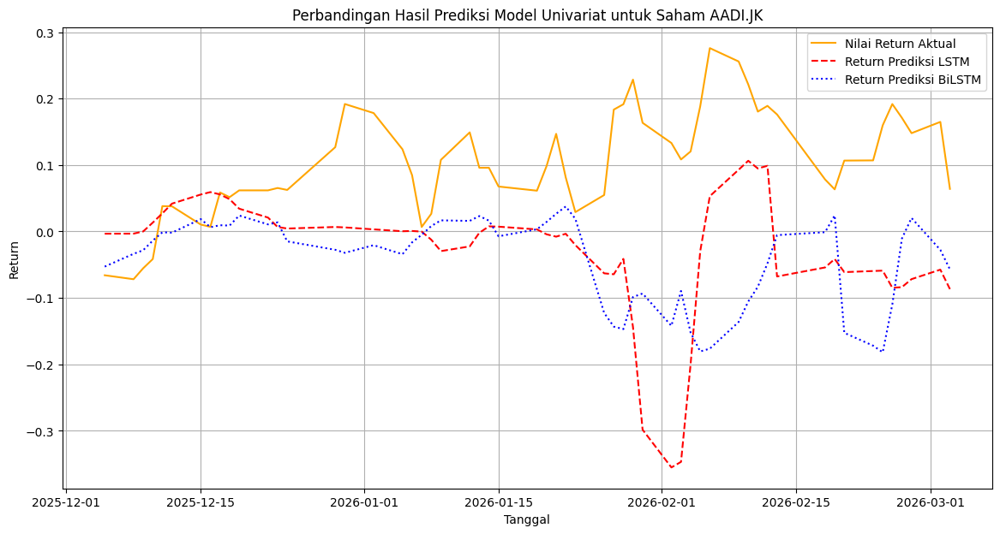

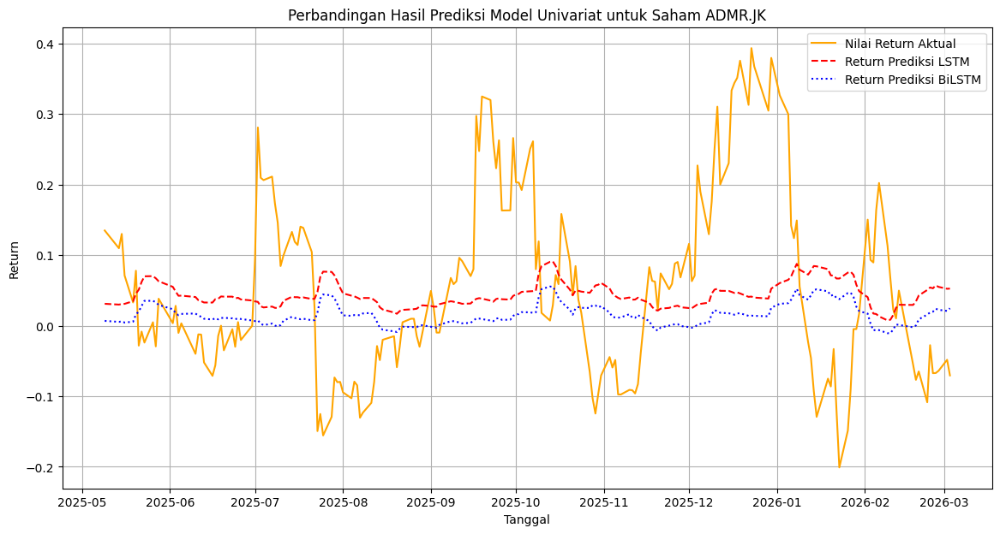

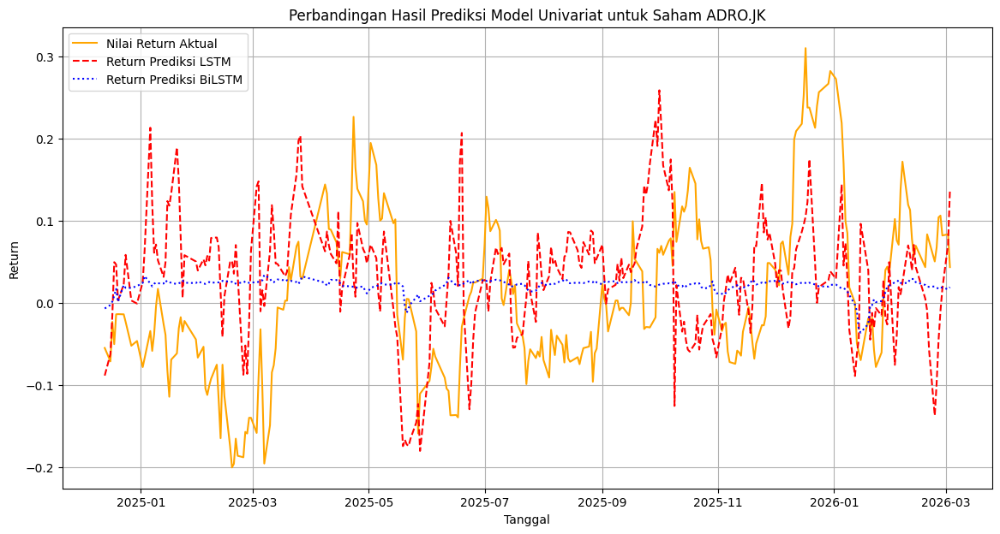

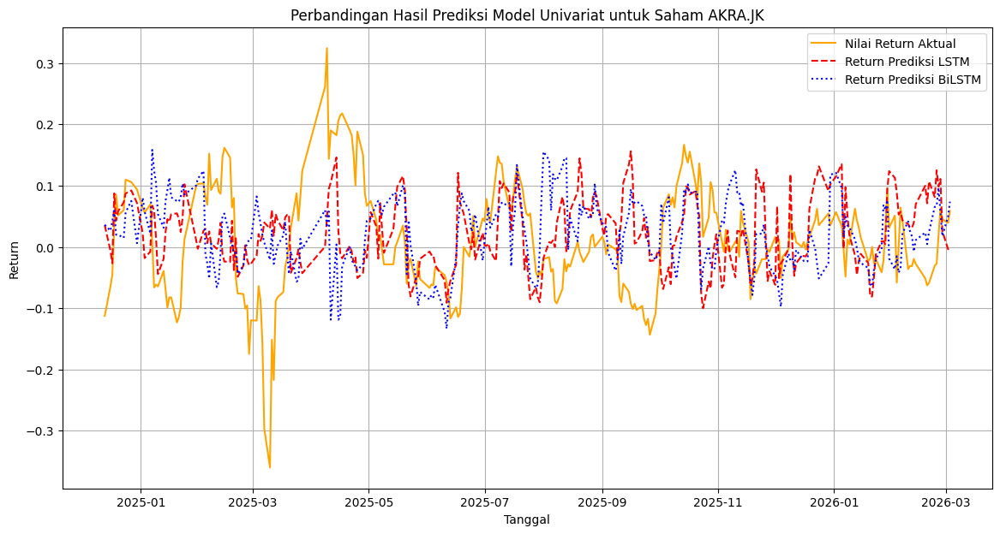

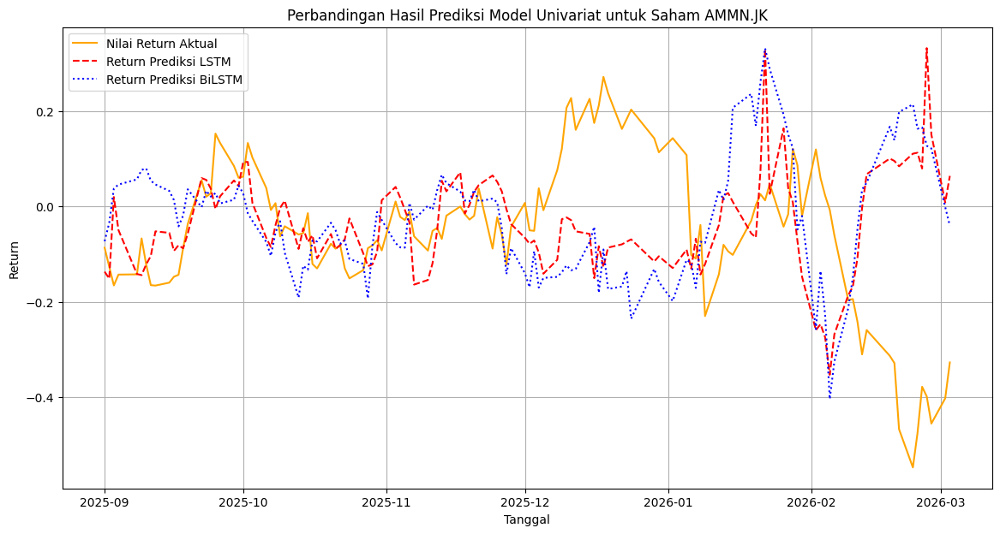

...

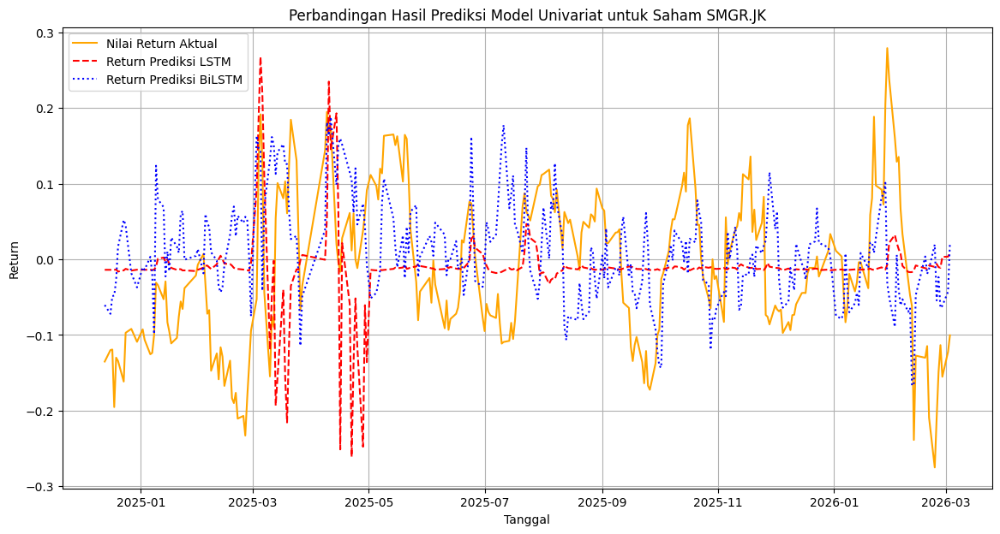

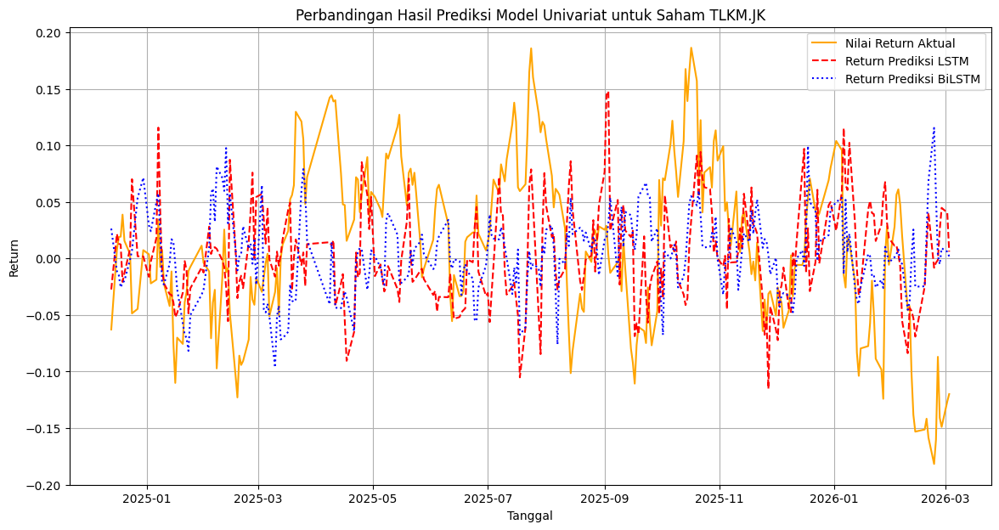

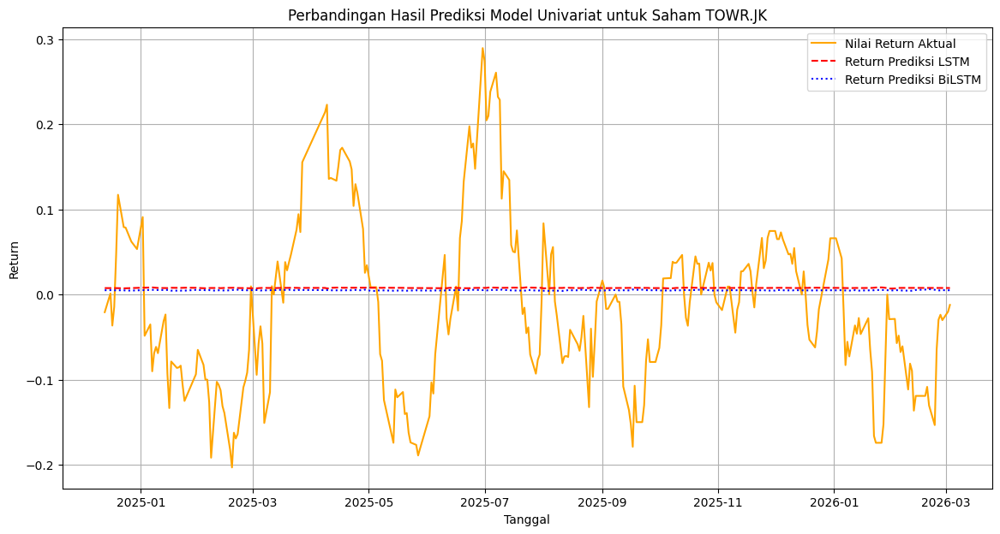

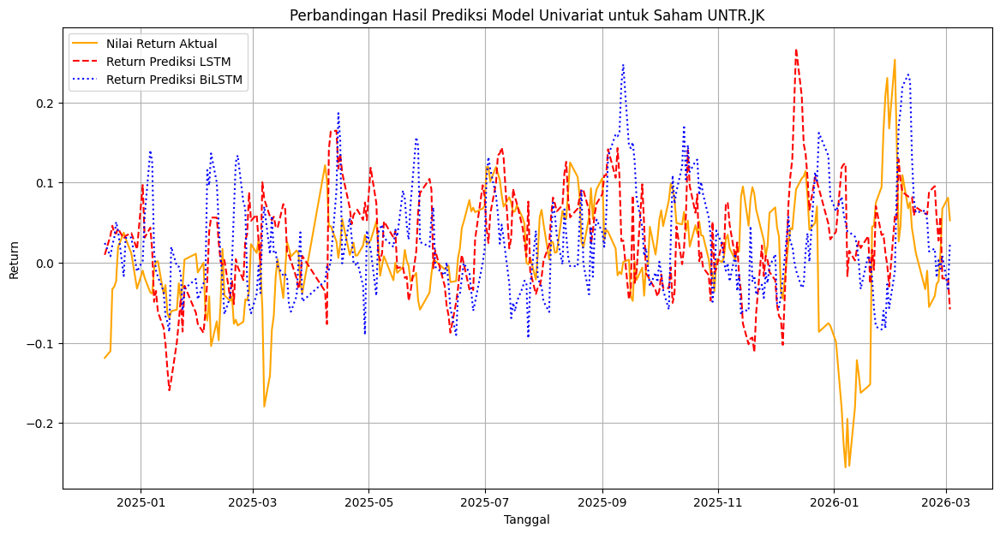

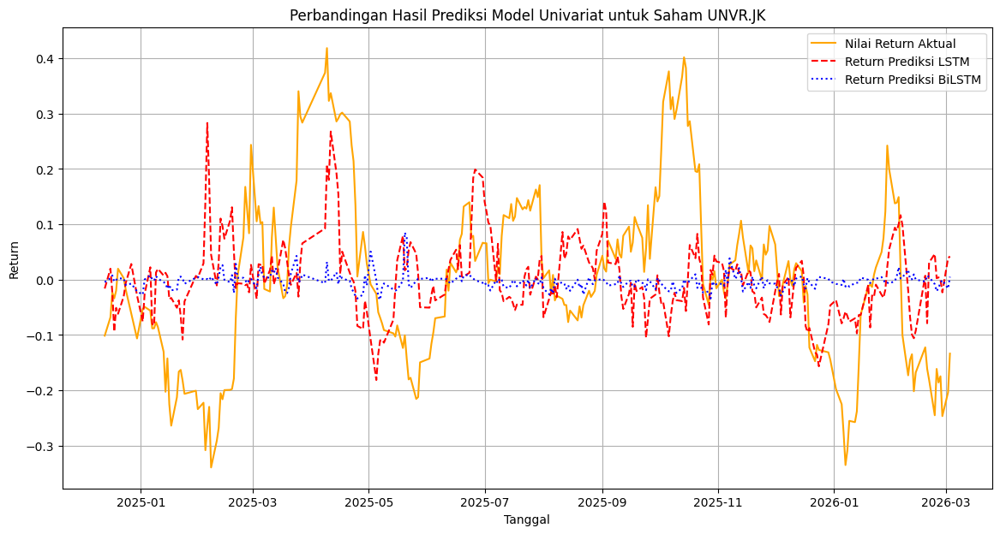

In [ ]:
for stock in stocks:
    if stock in lstm_all_dates_test and stock in bilstm_all_dates_test:
        dates_test = lstm_all_dates_test[stock]
        y_test_inv = lstm_all_y_test_inv[stock]
        lstm_y_pred_inv = lstm_all_y_pred_inv[stock]
        bilstm_y_pred_inv = bilstm_all_y_pred_inv[stock]

        plt.figure(figsize=(14, 7))
        plt.plot(dates_test, y_test_inv, label='Nilai Return Aktual', color='orange')
        plt.plot(dates_test, lstm_y_pred_inv, label='Return Prediksi LSTM', color='red', linestyle='--')
        plt.plot(dates_test, bilstm_y_pred_inv, label='Return Prediksi BiLSTM', color='blue', linestyle=':')

        plt.title(f'Perbandingan Hasil Prediksi Model Univariat untuk Saham {stock}')
        plt.xlabel('Tanggal')
        plt.ylabel('Return')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Skipping {stock} for plotting due to missing data in one or both models.")